# Image Super-Resolution

adapted from https://github.com/titu1994/Image-Super-Resolution

In [1]:
import os
import h5py
from PIL import Image
import requests
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from keras.models import Model
from keras.layers import Input, Conv2D, BatchNormalization, Activation, UpSampling2D, Add, Average, MaxPooling2D

Using TensorFlow backend.
/home/leon/miniconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
def generate_patches(img_arr, size=32, stride=16):
    i0_list = list(range(0, img_arr.shape[0], stride))
    j0_list = list(range(0, img_arr.shape[1], stride))
    patches = np.zeros((len(i0_list) * len(j0_list), size, size, img_arr.shape[2]), dtype=np.float32)
    n = 0
    for i in i0_list:
        for j in j0_list:
            img_patch = img_arr[i:(i+size), j:(j+size), :]
            patches[n, 0:img_patch.shape[0], 0:img_patch.shape[1], 0:img_patch.shape[2]] = img_patch
            n += 1
    return patches / 255

In [3]:
def combine_patches(patches_arr, shape=None, stride=16):
    i0_list = list(range(0, shape[0], stride))
    j0_list = list(range(0, shape[1], stride))
    combined = np.zeros((shape[0], shape[1], patches_arr.shape[3]), dtype=np.float32)
    overlap = np.zeros(shape)
    n = 0
    for i in i0_list:
        for j in j0_list:
            if i+patches_arr.shape[1] > shape[0]:
                p_h = shape[0] - i
            else:
                p_h = patches_arr.shape[1]
            if j+patches_arr.shape[2] > shape[1]:
                p_w = shape[1] - j
            else:
                p_w = patches_arr.shape[2]
            patch = patches_arr[n, :p_h, :p_w, :]
            overlap[i:(i+patch.shape[0]), j:(j+patch.shape[1])] += 1
            combined[i:(i+patch.shape[0]), j:(j+patch.shape[1]), :] += patch
            n += 1
    overlap[np.where(overlap == 0)] = 1
    for c in range(combined.shape[2]):
        combined[:, :, c] /= overlap
    combined *= 255
    return np.clip(combined, 0, 255).astype(np.uint8)

### SR CNN

In [4]:
input_shape = (32, 32, 3)

input_layer = Input(shape=input_shape)    
x = Conv2D(64, (9, 9), activation='relu', padding='same', name='level1')(input_layer)
x = Conv2D(32, (1, 1), activation='relu', padding='same', name='level2')(x)
output_layer = Conv2D(3, (5, 5), padding='same', name='output')(x)

model = Model(inputs=input_layer, outputs=output_layer)

# model.load_weights(os.path.expanduser('~/tmp/SR Weights 2X.h5'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
level1 (Conv2D)              (None, 32, 32, 64)        15616     
_________________________________________________________________
level2 (Conv2D)              (None, 32, 32, 32)        2080      
_________________________________________________________________
output (Conv2D)              (None, 32, 32, 3)         2403      
Total params: 20,099
Trainable params: 20,099
Non-trainable params: 0
_________________________________________________________________


In [5]:
f = h5py.File(os.path.expanduser('~/tmp/SR Weights 2X.h5'), mode='r')

weights = []
for layer_name in f.attrs['layer_names']:
    g = f[layer_name]
    for weight_name in g.attrs['weight_names']:
        weights.append(g[weight_name].value)

print([w.shape for w in weights])

weights[0] = weights[0].transpose((2,3,1,0))
weights[2] = weights[2].transpose((2,3,1,0))
weights[4] = weights[4].transpose((2,3,1,0))
print([w.shape for w in weights])

model.set_weights(weights)

f.close()

[(64, 3, 9, 9), (64,), (32, 64, 1, 1), (32,), (3, 32, 5, 5), (3,)]
[(9, 9, 3, 64), (64,), (1, 1, 64, 32), (32,), (5, 5, 32, 3), (3,)]


In [6]:
model.save('../../demos/data/image_super_resolution/sr.h5')

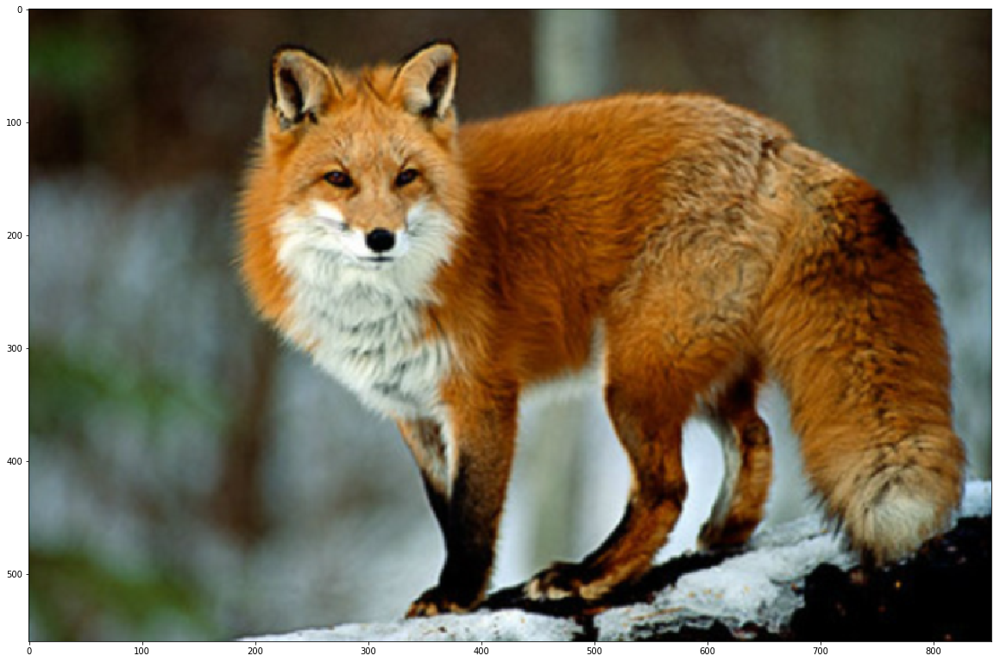

In [19]:
# url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/9/96/Common_zebra_1.jpg/250px-Common_zebra_1.jpg'
# url = 'https://images.unsplash.com/photo-1437275537121-331a0457c8d6?dpr=1&auto=format&fit=crop&w=376&h=251&q=60&cs=tinysrgb'
url = 'http://weknowyourdreams.com/images/fox/fox-10.jpg'
im = Image.open(requests.get(url, stream=True).raw)
im = im.resize((im.size[0] * 2, im.size[1] * 2), resample=Image.BILINEAR)
plt.figure(figsize=(20,20))
plt.imshow(im)

(1890, 32, 32, 3) float32
(560, 852, 3) uint8


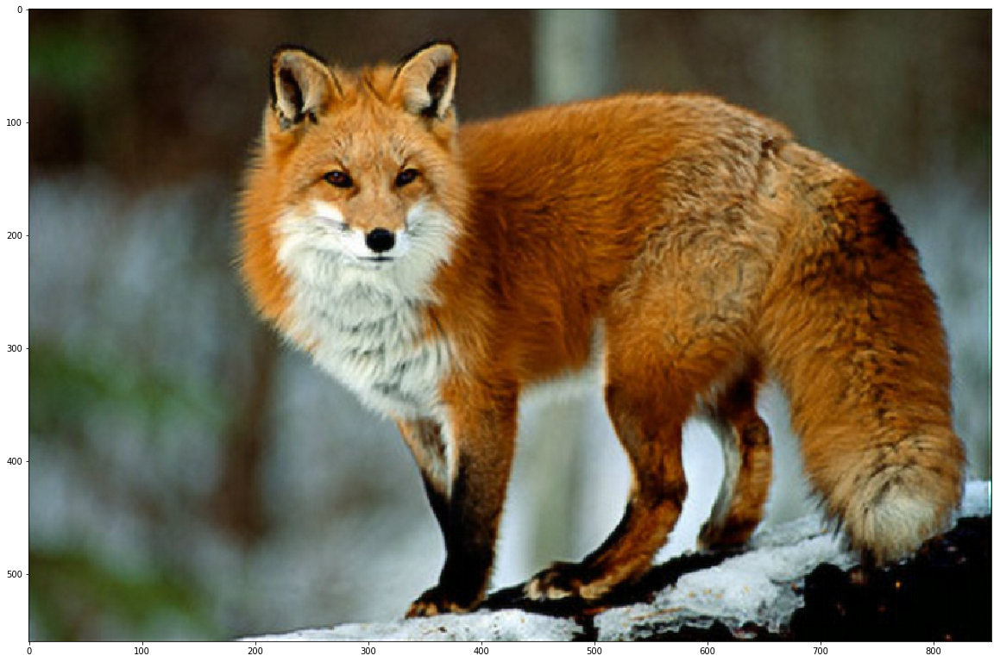

In [20]:
img_arr = np.array(im)
patches = generate_patches(img_arr, size=32, stride=16)
print(patches.shape, patches.dtype)

result = model.predict(patches)
result = combine_patches(result, shape=img_arr.shape[:2], stride=16)
print(result.shape, result.dtype)

plt.figure(figsize=(20,20))
plt.imshow(Image.fromarray(result))

### Expanded SR CNN

In [4]:
input_shape = (32, 32, 3)

input_layer = Input(shape=input_shape)    
x = Conv2D(64, (9, 9), activation='relu', padding='same', name='level1')(input_layer)
x1 = Conv2D(32, (1, 1), activation='relu', padding='same', name='lavel1_1')(x)
x2 = Conv2D(32, (3, 3), activation='relu', padding='same', name='lavel1_2')(x)
x3 = Conv2D(32, (5, 5), activation='relu', padding='same', name='lavel1_3')(x)

x = Average()([x1, x2, x3])

output_layer = Conv2D(3, (5, 5), activation='relu', padding='same', name='output')(x)

model = Model(inputs=input_layer, outputs=output_layer)

# model.load_weights(os.path.expanduser('~/tmp/Expantion SR Weights 2X.h5'))
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
level1 (Conv2D)                 (None, 32, 32, 64)   15616       input_1[0][0]                    
__________________________________________________________________________________________________
lavel1_1 (Conv2D)               (None, 32, 32, 32)   2080        level1[0][0]                     
__________________________________________________________________________________________________
lavel1_2 (Conv2D)               (None, 32, 32, 32)   18464       level1[0][0]                     
__________________________________________________________________________________________________
lavel1_3 (

In [5]:
f = h5py.File(os.path.expanduser('~/tmp/Expantion SR Weights 2X.h5'), mode='r')

weights = []
for layer_name in f.attrs['layer_names']:
    g = f[layer_name]
    for weight_name in g.attrs['weight_names']:
        weights.append(g[weight_name].value)

print([w.shape for w in weights])

weights[0] = weights[0].transpose((2,3,1,0))
weights[2] = weights[2].transpose((2,3,1,0))
weights[4] = weights[4].transpose((2,3,1,0))
weights[6] = weights[6].transpose((2,3,1,0))
weights[8] = weights[8].transpose((2,3,1,0))
print([w.shape for w in weights])

model.set_weights(weights)

f.close()

[(64, 3, 9, 9), (64,), (32, 64, 1, 1), (32,), (32, 64, 3, 3), (32,), (32, 64, 5, 5), (32,), (3, 32, 5, 5), (3,)]
[(9, 9, 3, 64), (64,), (1, 1, 64, 32), (32,), (3, 3, 64, 32), (32,), (5, 5, 64, 32), (32,), (5, 5, 32, 3), (3,)]


In [6]:
model.save('../../demos/data/image_super_resolution/esr.h5')

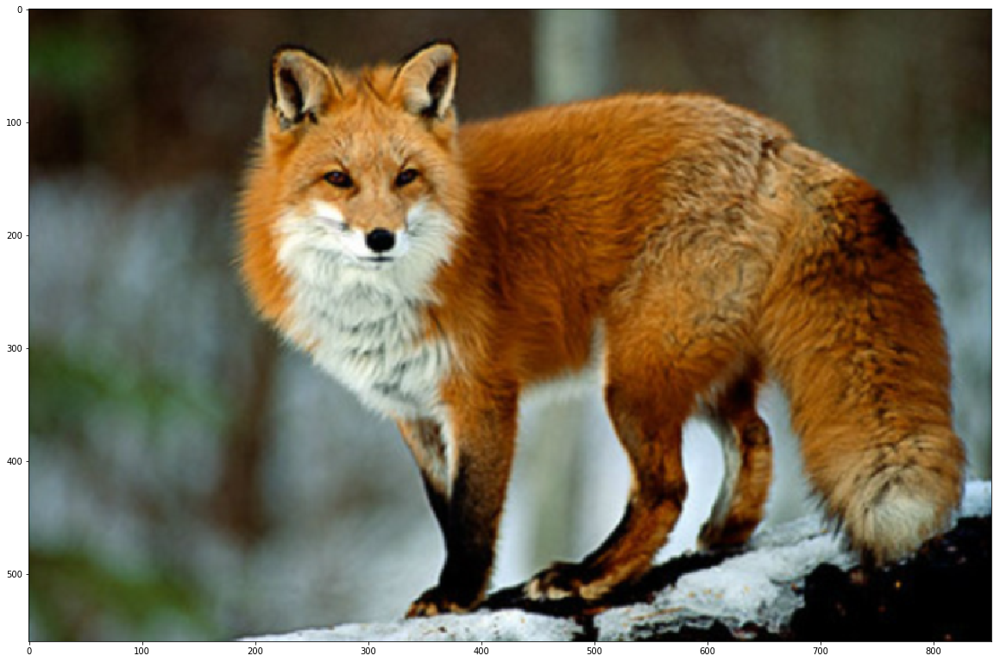

In [7]:
# url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/9/96/Common_zebra_1.jpg/250px-Common_zebra_1.jpg'
# url = 'https://images.unsplash.com/photo-1437275537121-331a0457c8d6?dpr=1&auto=format&fit=crop&w=376&h=251&q=60&cs=tinysrgb'
url = 'http://weknowyourdreams.com/images/fox/fox-10.jpg'
im = Image.open(requests.get(url, stream=True).raw)
im = im.resize((im.size[0] * 2, im.size[1] * 2), resample=Image.BILINEAR)
plt.figure(figsize=(20,20))
plt.imshow(im)

(1890, 32, 32, 3) float32
(560, 852, 3) uint8


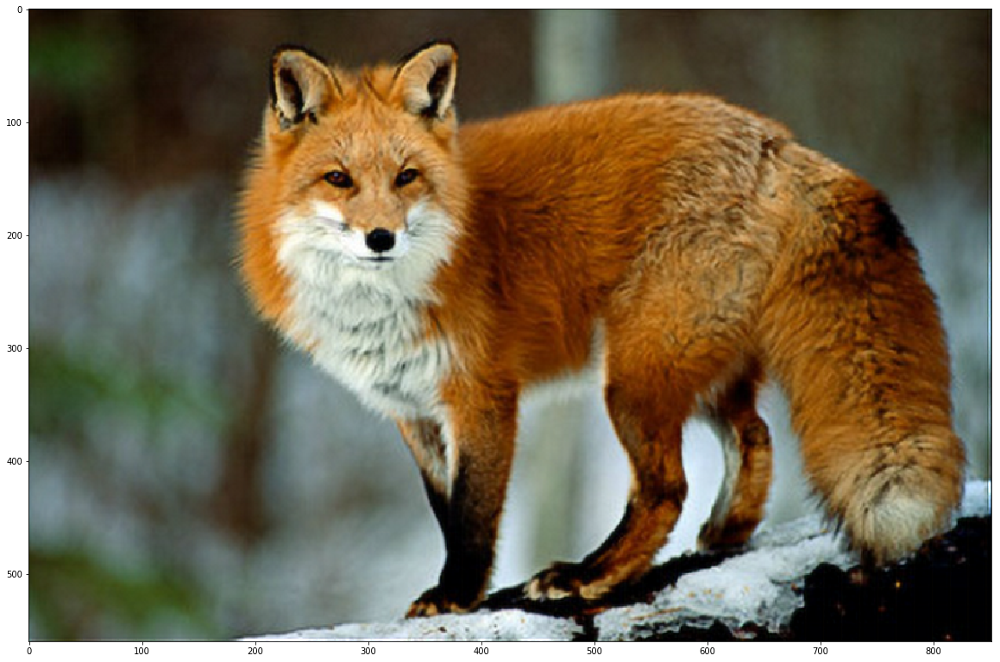

In [8]:
img_arr = np.array(im)
patches = generate_patches(img_arr, size=32, stride=16)
print(patches.shape, patches.dtype)

result = model.predict(patches)
result = combine_patches(result, shape=img_arr.shape[:2], stride=16)
print(result.shape, result.dtype)

plt.figure(figsize=(20,20))
plt.imshow(Image.fromarray(result))

### Deep Denoising Auto-Encoder SR CNN

In [4]:
input_shape = (32, 32, 3)

input_layer = Input(shape=input_shape)
c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)

x = MaxPooling2D((2, 2))(c1)

c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)

x = MaxPooling2D((2, 2))(c2)

c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(x)

x = UpSampling2D()(c3)

c2_2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
c2_2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2_2)

m1 = Add()([c2, c2_2])
m1 = UpSampling2D()(m1)

c1_2 = Conv2D(64, (3, 3), activation='relu', padding='same')(m1)
c1_2 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1_2)

m2 = Add()([c1, c1_2])

decoded = Conv2D(3, (5, 5), activation='linear', padding='same')(m2)

model = Model(inputs=input_layer, outputs=decoded)

# model.load_weights(os.path.expanduser('~/tmp/Deep Denoise Weights 2X.h5'))
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 64)   1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 32, 32, 64)   36928       conv2d_1[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 16, 16, 64)   0           conv2d_2[0][0]                   
__________________________________________________________________________________________________
conv2d_3 (

In [5]:
f = h5py.File(os.path.expanduser('~/tmp/Deep Denoise Weights 2X.h5'), mode='r')

weights = []
for layer_name in f.attrs['layer_names']:
    g = f[layer_name]
    for weight_name in g.attrs['weight_names']:
        weights.append(g[weight_name].value)

print([w.shape for w in weights])

for i in range(0, 20, 2):
    weights[i] = weights[i].transpose((2,3,1,0))
print([w.shape for w in weights])

model.set_weights(weights)

f.close()

[(64, 3, 3, 3), (64,), (64, 64, 3, 3), (64,), (128, 64, 3, 3), (128,), (128, 128, 3, 3), (128,), (256, 128, 3, 3), (256,), (128, 256, 3, 3), (128,), (128, 128, 3, 3), (128,), (64, 128, 3, 3), (64,), (64, 64, 3, 3), (64,), (3, 64, 5, 5), (3,)]
[(3, 3, 3, 64), (64,), (3, 3, 64, 64), (64,), (3, 3, 64, 128), (128,), (3, 3, 128, 128), (128,), (3, 3, 128, 256), (256,), (3, 3, 256, 128), (128,), (3, 3, 128, 128), (128,), (3, 3, 128, 64), (64,), (3, 3, 64, 64), (64,), (5, 5, 64, 3), (3,)]


In [6]:
model.save('../../demos/data/image_super_resolution/ddsr.h5')

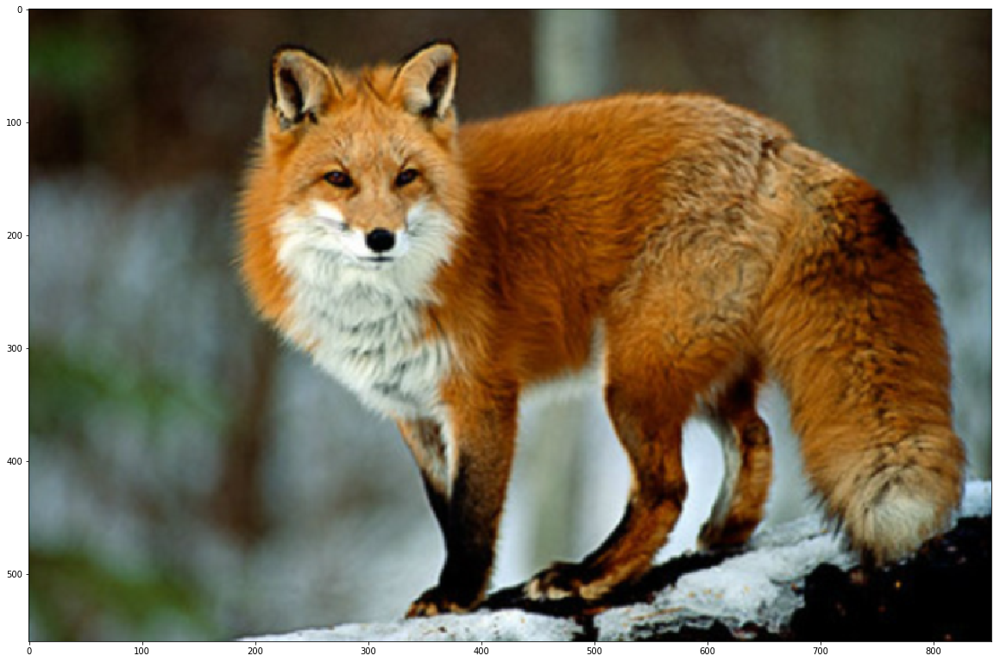

In [7]:
# url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/9/96/Common_zebra_1.jpg/250px-Common_zebra_1.jpg'
# url = 'https://images.unsplash.com/photo-1437275537121-331a0457c8d6?dpr=1&auto=format&fit=crop&w=376&h=251&q=60&cs=tinysrgb'
url = 'http://weknowyourdreams.com/images/fox/fox-10.jpg'
im = Image.open(requests.get(url, stream=True).raw)
im = im.resize((im.size[0] * 2, im.size[1] * 2), resample=Image.BILINEAR)
plt.figure(figsize=(20,20))
plt.imshow(im)

(1890, 32, 32, 3) float32
(560, 852, 3) uint8


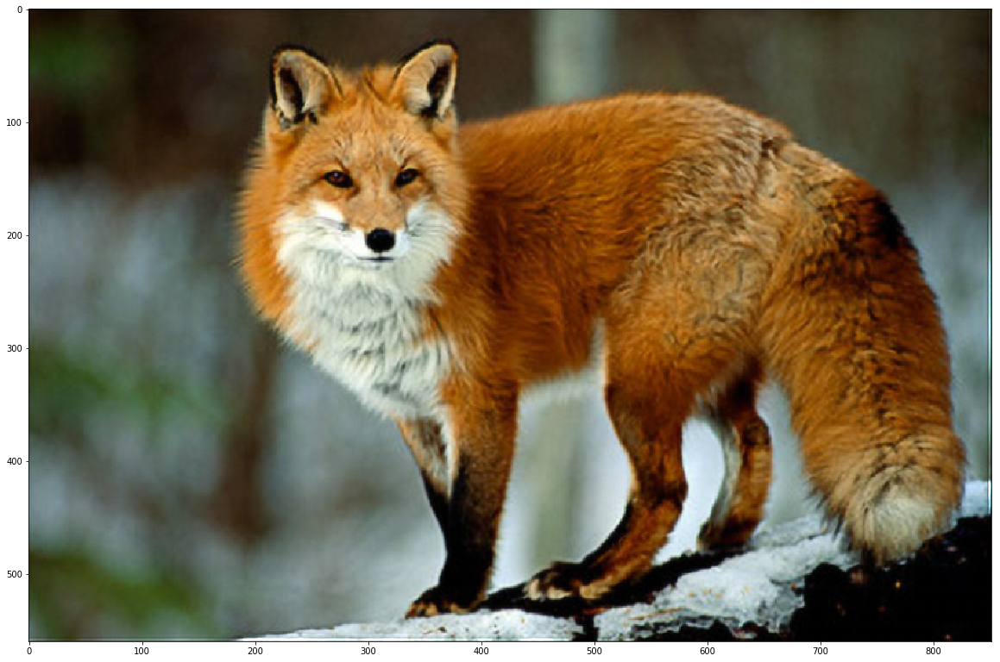

In [8]:
img_arr = np.array(im)
patches = generate_patches(img_arr, size=32, stride=16)
print(patches.shape, patches.dtype)

result = model.predict(patches)
result = combine_patches(result, shape=img_arr.shape[:2], stride=16)
print(result.shape, result.dtype)

plt.figure(figsize=(20,20))
plt.imshow(Image.fromarray(result))

### ResNet SR

In [4]:
def _residual_block(ip, id):
    init = ip
    x = Conv2D(64, (3, 3), activation='linear', padding='same', name='sr_res_conv_' + str(id) + '_1')(ip)
    x = BatchNormalization(axis=-1, name="sr_res_batchnorm_" + str(id) + "_1")(x)
    x = Activation('relu', name="sr_res_activation_" + str(id) + "_1")(x)
    x = Conv2D(64, (3, 3), activation='linear', padding='same', name='sr_res_conv_' + str(id) + '_2')(x)
    x = BatchNormalization(axis=-1, name="sr_res_batchnorm_" + str(id) + "_2")(x)
    m = Add(name="sr_res_merge_" + str(id))([x, init])
    return m

def _upscale_block(ip, id):
    init = ip
    x = UpSampling2D()(init)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='sr_res_filter1_%d' % id)(x)
    return x

In [5]:
input_shape = (32, 32, 3)

input_layer = Input(shape=input_shape)    
x0 = Conv2D(64, (3, 3), activation='relu', padding='same', name='sr_res_conv1')(input_layer)
x = _residual_block(x0, 1)
nb_residual = 5
for i in range(5):
    x = _residual_block(x, i + 2)
x = Add()([x, x0])
x = _upscale_block(x, 1)
output_layer = Conv2D(3, (3, 3), activation='linear', padding='same', name='sr_res_conv_final')(x)

model = Model(inputs=input_layer, outputs=output_layer)

model.load_weights(os.path.expanduser('~/tmp/ResNetSR 2X.h5'))
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
sr_res_conv1 (Conv2D)           (None, 32, 32, 64)   1792        input_1[0][0]                    
__________________________________________________________________________________________________
sr_res_conv_1_1 (Conv2D)        (None, 32, 32, 64)   36928       sr_res_conv1[0][0]               
__________________________________________________________________________________________________
sr_res_batchnorm_1_1 (BatchNorm (None, 32, 32, 64)   256         sr_res_conv_1_1[0][0]            
__________________________________________________________________________________________________
sr_res_act

In [6]:
model.save('../../demos/data/image_super_resolution/rnsr.h5')

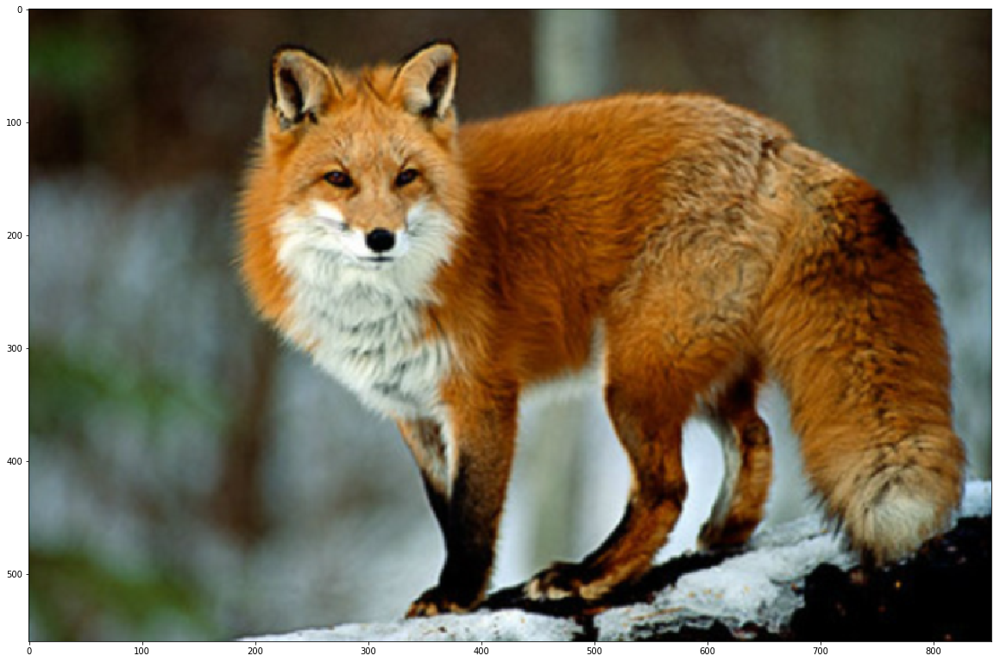

In [7]:
# url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/9/96/Common_zebra_1.jpg/250px-Common_zebra_1.jpg'
# url = 'https://images.unsplash.com/photo-1437275537121-331a0457c8d6?dpr=1&auto=format&fit=crop&w=376&h=251&q=60&cs=tinysrgb'
url = 'http://weknowyourdreams.com/images/fox/fox-10.jpg'
im = Image.open(requests.get(url, stream=True).raw)
im_resized = im.resize((im.size[0] * 2, im.size[1] * 2), resample=Image.BILINEAR)
plt.figure(figsize=(20,20))
plt.imshow(im_resized)

(486, 32, 32, 3) float32
(560, 852, 3) uint8


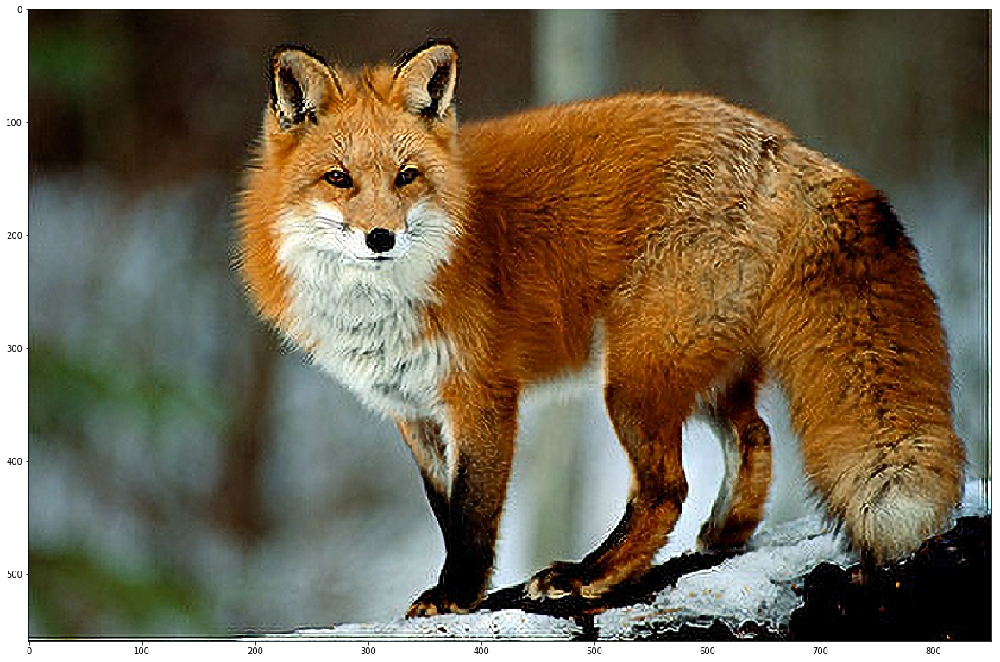

In [8]:
img_arr = np.array(im)
patches = generate_patches(img_arr, size=32, stride=16)
print(patches.shape, patches.dtype)

result = model.predict(patches)
new_shape = (img_arr.shape[0] * 2, img_arr.shape[1] * 2)
result = combine_patches(result, shape=new_shape, stride=32)
print(result.shape, result.dtype)

plt.figure(figsize=(20,20))
plt.imshow(Image.fromarray(result))

### Distilled ResNet SR

In [4]:
def _residual_block(ip, id):
    init = ip
    x = Conv2D(32, (3, 3), activation='linear', padding='same', name='student_sr_res_conv_' + str(id) + '_1')(ip)
    x = BatchNormalization(axis=-1, name="student_sr_res_batchnorm_" + str(id) + "_1")(x)
    x = Activation('relu', name="student_sr_res_activation_" + str(id) + "_1")(x)
    x = Conv2D(32, (3, 3), activation='linear', padding='same', name='student_sr_res_conv_' + str(id) + '_2')(x)
    x = BatchNormalization(axis=-1, name="student_sr_res_batchnorm_" + str(id) + "_2")(x)
    m = Add(name="student_sr_res_merge_" + str(id))([x, init])
    return m

def _upscale_block(ip, id):
    init = ip
    x = UpSampling2D(name='student_upsampling_%d' % id)(init)
    x = Conv2D(32 * 2, (3, 3), activation='relu', padding='same', name='student_sr_res_filter1_%d' % id)(x)
    return x

In [5]:
input_shape = (32, 32, 3)

input_layer = Input(shape=input_shape)    
x0 = Conv2D(32, (3, 3), activation='relu', padding='same', name='student_sr_res_conv1')(input_layer)
x = _residual_block(x0, 1)
x = Add(name='student_residual')([x, x0])
x = _upscale_block(x, 1)
output_layer = Conv2D(3, (3, 3), activation='linear', padding='same', name='student_sr_res_conv_final')(x)

model = Model(inputs=input_layer, outputs=output_layer)

model.load_weights(os.path.expanduser('~/tmp/DistilledResNetSR 2X.h5'))
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
student_sr_res_conv1 (Conv2D)   (None, 32, 32, 32)   896         input_1[0][0]                    
__________________________________________________________________________________________________
student_sr_res_conv_1_1 (Conv2D (None, 32, 32, 32)   9248        student_sr_res_conv1[0][0]       
__________________________________________________________________________________________________
student_sr_res_batchnorm_1_1 (B (None, 32, 32, 32)   128         student_sr_res_conv_1_1[0][0]    
__________________________________________________________________________________________________
student_sr

In [6]:
model.save('../../demos/data/image_super_resolution/drnsr.h5')

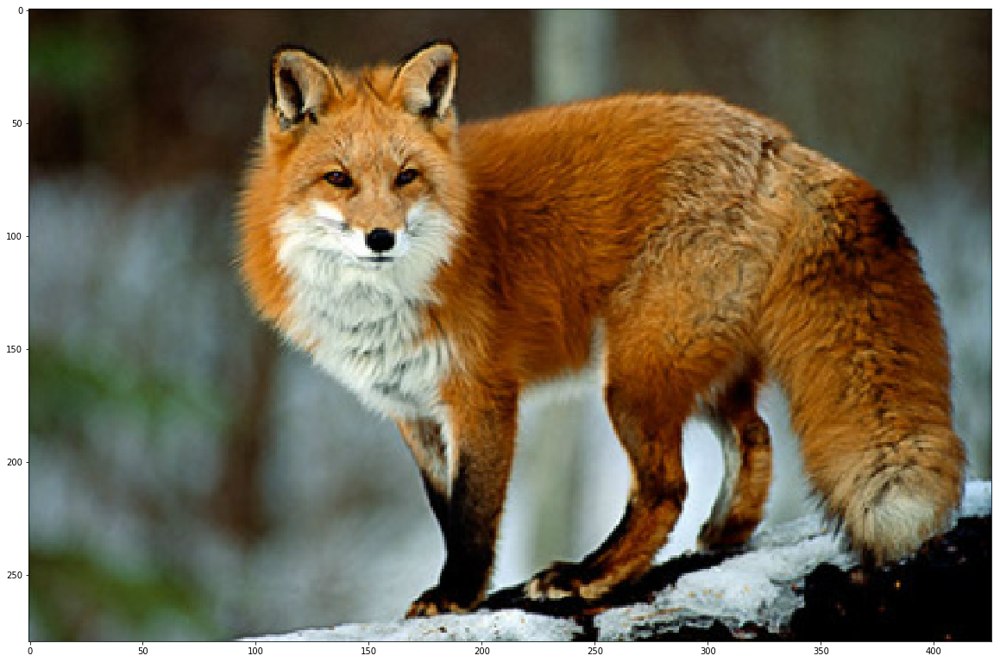

In [8]:
# url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/9/96/Common_zebra_1.jpg/250px-Common_zebra_1.jpg'
# url = 'https://images.unsplash.com/photo-1437275537121-331a0457c8d6?dpr=1&auto=format&fit=crop&w=376&h=251&q=60&cs=tinysrgb'
url = 'http://weknowyourdreams.com/images/fox/fox-10.jpg'
im = Image.open(requests.get(url, stream=True).raw)
im_resized = im.resize((im.size[0] * 2, im.size[1] * 2), resample=Image.BILINEAR)
plt.figure(figsize=(20,20))
plt.imshow(im)

(486, 32, 32, 3) float32
(560, 852, 3) uint8


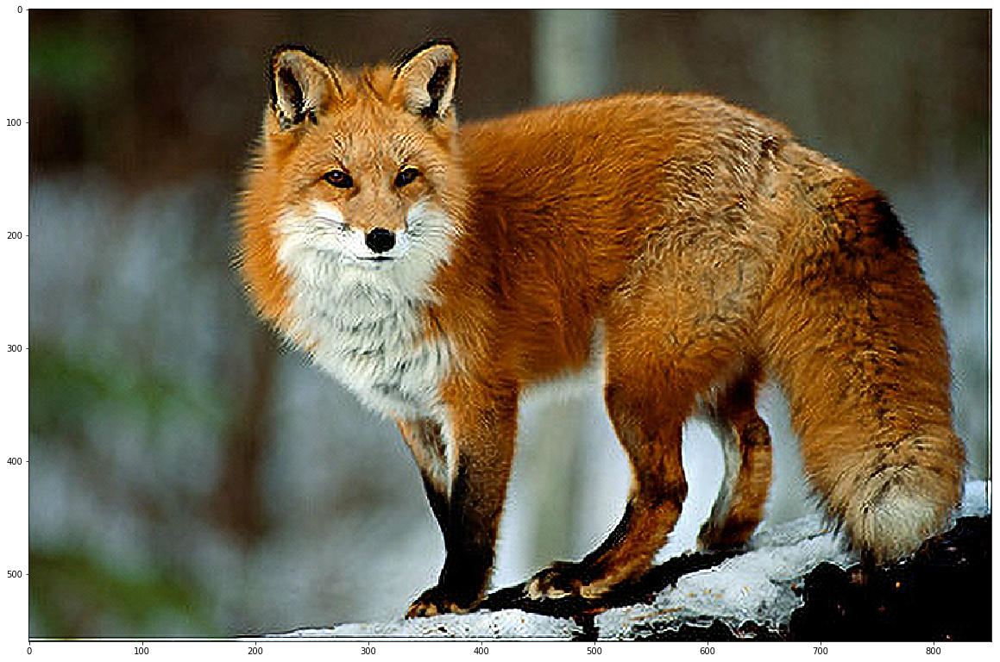

In [9]:
img_arr = np.array(im)
patches = generate_patches(img_arr, size=32, stride=16)
print(patches.shape, patches.dtype)

result = model.predict(patches)
new_shape = (img_arr.shape[0] * 2, img_arr.shape[1] * 2)
result = combine_patches(result, shape=new_shape, stride=32)
print(result.shape, result.dtype)

plt.figure(figsize=(20,20))
plt.imshow(Image.fromarray(result))